# Classification dog and cat using PyTorch from scratch
* [x] Original source: https://www.kaggle.com/c/dogs-vs-cats/data?select=train.zip
* [x] full Dataset: https://www.kaggle.com/datasets/salader/dogs-vs-cats
* [x] Download dataset by click on this link https://www.kaggle.com/datasets/salader/dogs-vs-cats/download?datasetVersionNumber=1
* [x] And download with key `kaggle competitions download -c dogs-vs-cats`

# Step by Step
1. Download dataset from https://www.kaggle.com/datasets/salader/dogs-vs-cats/download?datasetVersionNumber=1 into `data/dogvscat/`
2. Pre-processing data from dataset.
3. Create `DogandCatDataset` class to get image and transformed_image.
4. Push data to Dataloader and Testing `DogandCatDataset` class.
5. Create TinyVGG Neural Network.
6. Create `train_step()`, `test_step()` and `train()` to train model.
7. Visualize training and testing processing.
8. Make predict and visualize it.
9. Upgrade model if the results aren't good.

## Step 1: Download dataset

In [1]:
!pip install -q kaggle

In [2]:
import os
from pathlib import Path
import zipfile
import requests

# Setup path
root_path = Path('./data')
root_image_path = root_path / "dogvscat"

if not root_image_path.is_dir():
  print(f'Creating directory {root_image_path}...')
  root_image_path.mkdir(parents=True, exist_ok=True)

zipfile_path = root_path / 'dogvscat.zip'
# if not zipfile_path.is_file():
  # Download data
request = requests.get('https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip')
with open(zipfile_path, 'wb') as f:
  print(f'Downloading {zipfile_path}...')
  f.write(request.content)

# Unzip data
with zipfile.ZipFile(zipfile_path, 'r') as zip_ref:
  print(f'Unzipping {zipfile_path}...')
  zip_ref.extractall(root_image_path)

Creating directory data/dogvscat...
Unzipping data/dogvscat.zip...


## Step 2: Pre-processing dataset

In [3]:
!rm -f /content/data/dogvscat/cats_and_dogs_filtered/vectorize.py

In [4]:
!mv /content/data/dogvscat/cats_and_dogs_filtered/train /content/data/dogvscat
!mv /content/data/dogvscat/cats_and_dogs_filtered/validation /content/data/dogvscat

In [5]:
!rm -r /content/data/dogvscat/cats_and_dogs_filtered

In [6]:
import os

def walk_through_dir(dir_path):
  image_paths = []
  for dirpath, dirnames, filenames in os.walk(dir_path):
    if filenames:
      print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")
      for filename in filenames:
        path = os.path.join(dirpath, filename)
        image_paths.append(path)
  return image_paths
image_path_list = walk_through_dir(root_image_path)

There are 0 directories and 1000 images in 'data/dogvscat/train/cats'.
There are 0 directories and 1000 images in 'data/dogvscat/train/dogs'.
There are 0 directories and 500 images in 'data/dogvscat/validation/cats'.
There are 0 directories and 500 images in 'data/dogvscat/validation/dogs'.


In [7]:
len(image_path_list)

3000

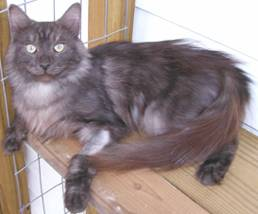

In [8]:
from PIL import Image

image = Image.open(image_path_list[1])
image

## Step 3: Create `DogsvsCatsDataset` class

In [9]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os

class DogsvsCatsDataset(Dataset):
  def __init__(self, tar_dir, transform : transforms =None):

    self.image_paths = self._walk_through_dir(tar_dir)
    self.classes, self.cls_to_idx = self._find_classes(tar_dir)
    self.transform = transform

  def _walk_through_dir(self, tar_dir):
    dir_paths = [dir_path for dir_path, _, filenames in os.walk(tar_dir) if filenames]
    image_paths = []
    for path in dir_paths:
     image_paths += Path(path).glob("*.jpg")
    return image_paths

  def _find_classes(self, tar_dir):

    classes = sorted(entry.name for entry in os.scandir(tar_dir) if entry.is_dir())
    if not classes:
      raise FileNotFoundError(f"Couldn't find any class name, please check your target path!")
    cls_to_idx = {cls_name: i for i, cls_name in enumerate(classes)}
    return classes, cls_to_idx

  def _load_image(self, index):
    image = Image.open(self.image_paths[index])
    return image

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, index):
    image = self._load_image(index)
    class_name = self.image_paths[index].parent.stem
    cls_to_idx = self.cls_to_idx[class_name]

    if self.transform:
      return self.transform(image), cls_to_idx
    return image, cls_to_idx


## Step 4: Push data to Dataloader and Testing `DogandCatDataset` class.

In [10]:
train_dir = root_image_path / 'train'
test_dir = root_image_path / 'validation'
train_dir, test_dir

(PosixPath('data/dogvscat/train'), PosixPath('data/dogvscat/validation'))

In [11]:
train_transformer = transforms.Compose([
    transforms.Resize(size=(64,64)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
])

test_transformer = transforms.Compose([
    transforms.Resize(size=(64,64)),
    transforms.ToTensor()
])

In [12]:
train_data = DogsvsCatsDataset(train_dir, train_transformer)
test_data = DogsvsCatsDataset(test_dir, test_transformer)

(-0.5, 63.5, 63.5, -0.5)

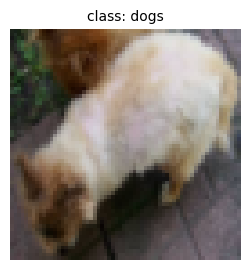

In [13]:
import matplotlib.pyplot as plt

random_idx = torch.randint(0, len(train_data), size=[1]).item()

image, cls_to_idx = train_data[random_idx]
class_name = train_data.classes[cls_to_idx]

plt.figure(figsize=(3,3))
plt.imshow(image.permute(1,2,0))
plt.title(f'class: {class_name}', fontsize=10)
plt.axis(False)

train_dataloader: 63 batches of 32
test_dataloader: 32 batches of 32
images shape: torch.Size([32, 3, 64, 64])
labels shape: torch.Size([32])


(-0.5, 63.5, 63.5, -0.5)

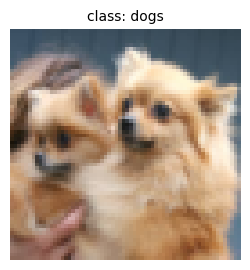

In [14]:
from torch.utils.data import DataLoader

batch_size = 32
num_workers = 0

train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=num_workers)

print(f'train_dataloader: {len(train_dataloader)} batches of {batch_size}')
print(f'test_dataloader: {len(test_dataloader)} batches of {batch_size}')

images, labels = next(iter(train_dataloader))

print(f'images shape: {images.shape}')
print(f'labels shape: {labels.shape}')

plt.figure(figsize=(3,3))
plt.imshow(images[0].permute(1,2,0))
plt.title(f'class: {train_data.classes[labels[0]]}', fontsize=10)
plt.axis(False)

## Step 5: Create TinyVGG Neural Network.

In [15]:
import torch
from torch import nn

class TinyVGG(nn.Module):
  def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
    super().__init__()

    self.conv_block_1 = nn.Sequential(
        nn.Conv2d(in_channels=input_shape, out_channels=hidden_units, kernel_size=3, stride=1, padding=0),
        nn.ReLU(),
        nn.Conv2d(in_channels=hidden_units, out_channels=hidden_units, kernel_size=3, stride=1, padding=0),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    self.conv_block_2 = nn.Sequential(
        nn.Conv2d(hidden_units, hidden_units, 3, 1, 0),
        nn.ReLU(),
        nn.Conv2d(hidden_units, hidden_units, 3, 1, 0),
        nn.ReLU(),
        nn.MaxPool2d(2,2)
    )
    self.classifier = nn.Sequential(
        nn.Flatten(),
        nn.Linear(in_features=hidden_units*13*13, out_features=output_shape)
    )

  def forward(self, X: torch.Tensor) -> torch.Tensor:
    X = self.conv_block_1(X)
    X = self.conv_block_2(X)
    X = self.classifier(X)
    return X

In [16]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [17]:
!pip install -q torchinfo

In [18]:
from torchinfo import summary
torch.manual_seed(42)

model_0 = TinyVGG(input_shape=3, hidden_units=10, output_shape=len(train_data.classes)).to(device)
summary(model_0, (32, 3, 64, 64))

Layer (type:depth-idx)                   Output Shape              Param #
TinyVGG                                  [32, 2]                   --
├─Sequential: 1-1                        [32, 10, 30, 30]          --
│    └─Conv2d: 2-1                       [32, 10, 62, 62]          280
│    └─ReLU: 2-2                         [32, 10, 62, 62]          --
│    └─Conv2d: 2-3                       [32, 10, 60, 60]          910
│    └─ReLU: 2-4                         [32, 10, 60, 60]          --
│    └─MaxPool2d: 2-5                    [32, 10, 30, 30]          --
├─Sequential: 1-2                        [32, 10, 13, 13]          --
│    └─Conv2d: 2-6                       [32, 10, 28, 28]          910
│    └─ReLU: 2-7                         [32, 10, 28, 28]          --
│    └─Conv2d: 2-8                       [32, 10, 26, 26]          910
│    └─ReLU: 2-9                         [32, 10, 26, 26]          --
│    └─MaxPool2d: 2-10                   [32, 10, 13, 13]          --
├─Sequentia

In [23]:
# Test model
image, label = train_data[0]
image = image.unsqueeze(0).to(device)
with torch.inference_mode():
  y = model_0(image)

## Step 6: Create train_step(), test_step() and train() to train model.

In [24]:
def train_step(model, train_dataloader, optimizer, loss_fn, device):
  model.train()

  train_loss, train_acc = 0, 0
  for batch, (X, y) in enumerate(train_dataloader):
    X, y = X.to(device), y.to(device)

    # Forward pass
    y_pred = model(X)
    # Loss calculate
    loss = loss_fn(y_pred, y)
    train_loss += loss.item()
    correct = torch.eq(torch.argmax(torch.softmax(y_pred, dim=1), dim=1), y).sum().item()
    train_acc += (correct / len(y))
    # Backward
    optimizer.zero_grad()
    loss.backward()
    # Update weights
    optimizer.step()
    # if (batch+1) % 20 == 0:
    #   print(f"Looked at {batch * len(X)}/{len(train_dataloader.dataset)} samples")

  train_loss /= len(train_dataloader)
  train_acc /= len(train_dataloader)
  return train_loss, train_acc

In [25]:
def test_step(model, test_dataloader, loss_fn, device):
  model.eval()

  with torch.inference_mode():
    test_loss, test_acc = 0, 0
    for X, y in test_dataloader:
      X, y = X.to(device), y.to(device)
      y_pred = model(X)
      loss = loss_fn(y_pred, y)
      test_loss += loss.item()
      correct = torch.eq(torch.argmax(torch.softmax(y_pred, dim=1), dim=1), y).sum().item()
      test_acc += (correct / len(y))

    test_loss /= len(test_dataloader)
    test_acc /= len(test_dataloader)
  return test_loss, test_acc

In [29]:
from tqdm import tqdm
from timeit import default_timer as timer

def train(model, epochs, lr, train_dataloader, test_dataloader, device):
  # Create loss_fn and optimizer
  loss_fn = nn.CrossEntropyLoss()
  optimizer = torch.optim.AdamW(params=model.parameters(), lr=lr)

  results = {
      'train_loss': [],
      'train_acc': [],
      'test_loss': [],
      'test_acc': [],
      'time_train': 0,
      "model_name": model.__class__.__name__,
      'device': device
  }
  start_train = timer()
  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = train_step(model, train_dataloader, optimizer, loss_fn, device)
    test_loss, test_acc = test_step(model, test_dataloader, loss_fn, device)
    results['train_loss'].append(train_loss)
    results['train_acc'].append(train_acc)
    results['test_loss'].append(test_loss)
    results['test_acc'].append(test_acc)
  end_train = timer()
  results['time_train'] = end_train - start_train
  print(f'\nTime train {model.__class__.__name__} on {device} is {end_train - start_train} seconds')
  return results

In [30]:
results_model_0 = train(model=model_0, epochs=50, lr=0.001, train_dataloader=train_dataloader, test_dataloader=test_dataloader, device=device)

100%|██████████| 50/50 [06:16<00:00,  7.53s/it]


Time train TinyVGG on cuda is 376.558428853 seconds


## Step 7: Visualize training and testing processing.

In [38]:
def plot_training_and_testing_results(results):
  train_loss = results['train_loss']
  train_acc = results['train_acc']
  test_loss = results['test_loss']
  test_acc = results['test_acc']

  epochs = range(len(train_loss))

  plt.figure(figsize=(10,7))
  plt.suptitle(f'Time train {results["model_name"]} on {results["device"]} in {epochs[-1] + 1} epochs is {results["time_train"]:.3f} seconds', fontsize=15)

  plt.subplot(1,2,1)
  plt.plot(epochs, train_loss, label='train_loss')
  plt.plot(epochs, test_loss, label='test_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()
  plt.grid(True)

  plt.subplot(1,2,2)
  plt.plot(epochs, train_acc, label='train_acc')
  plt.plot(epochs, test_acc, label='test_acc')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend()
  plt.grid(True)

  plt.tight_layout()
  plt.show()


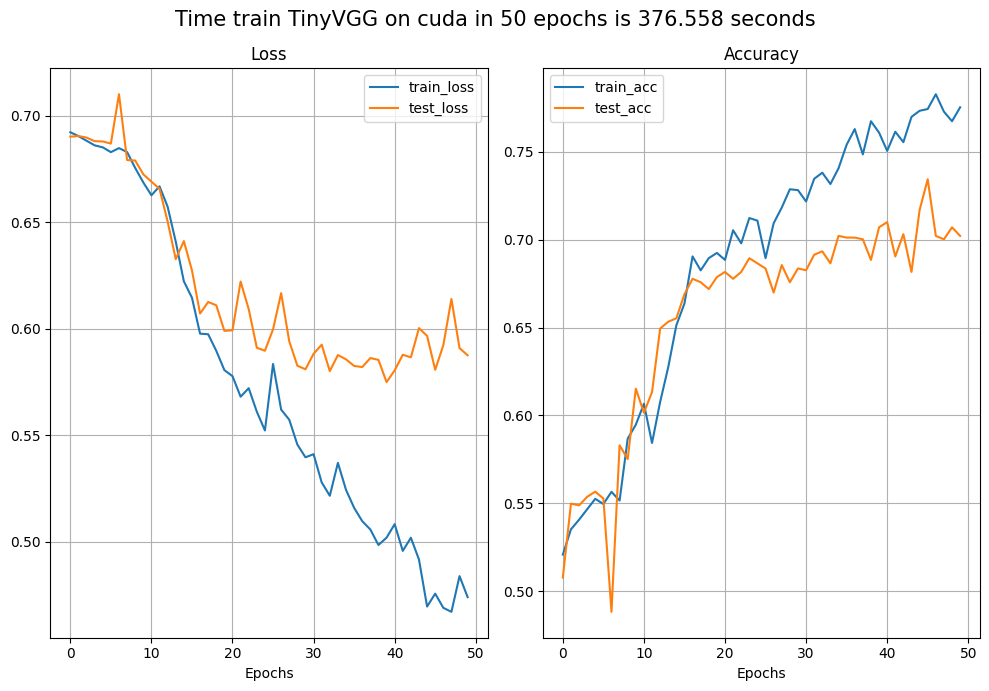

In [39]:
plot_training_and_testing_results(results_model_0)

In [33]:
results_model_0['train_loss'][-1], results_model_0['test_loss'][-1]

(0.4741221425079164, 0.5875775692984462)

## Step 8: Make predict and visualize it.

In [47]:
import requests
from PIL import Image
def download_image(url, file_name):
  print(f'Downloading {file_name}...')
  request = requests.get(url)
  with open(file_name, 'wb') as f:
    f.write(request.content)
  return Image.open(file_name)

In [35]:
def make_predict(model, image, transformer, device):
  model.eval()
  transformed_image = transformer(image).unsqueeze(0).to(device)
  with torch.inference_mode():
    y_pred = model(transformed_image).to(device)
    prob = torch.softmax(y_pred, dim=1).cpu().max().item()
    cls_to_idx = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
    class_name = train_data.classes[cls_to_idx]
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.title(f'class: {class_name} | prob: {prob:.3f}', fontsize=15)
    plt.axis(False)

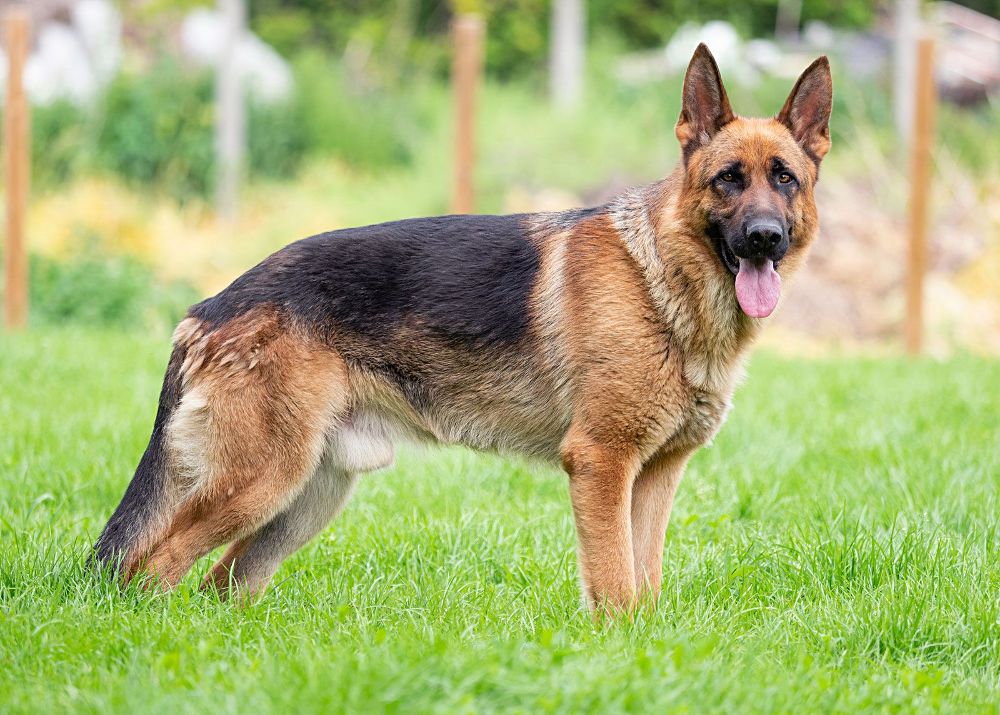

In [36]:
dog_image = download_image(url="https://cdn.britannica.com/79/232779-050-6B0411D7/German-Shepherd-dog-Alsatian.jpg", file_name='dog.jpg')
dog_image

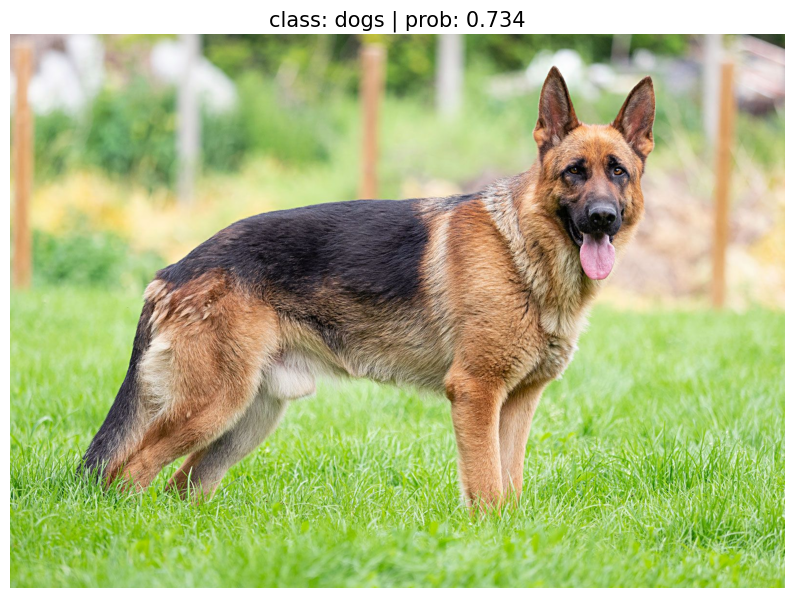

In [37]:
make_predict(model_0, dog_image, test_transformer, device)

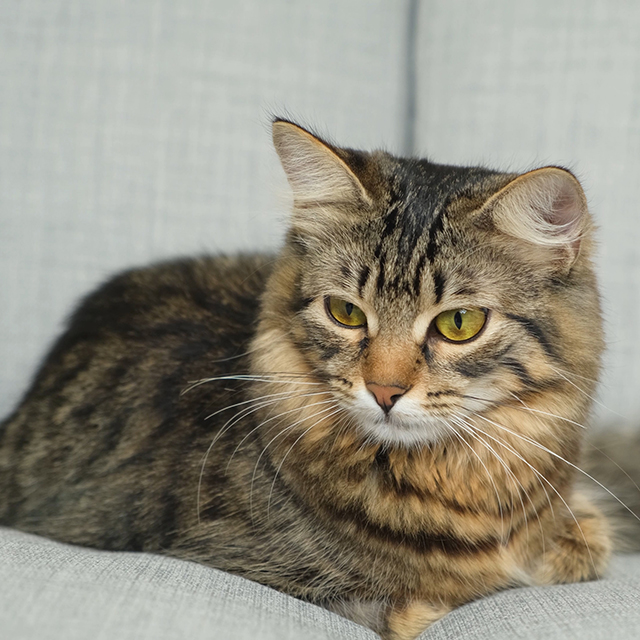

In [46]:
cat_image = download_image(url="https://static01.nyt.com/images/2024/03/05/autossell/00TB-MEOWS/00TB-MEOWS-square640.jpg", file_name='cat.jpg')
cat_image

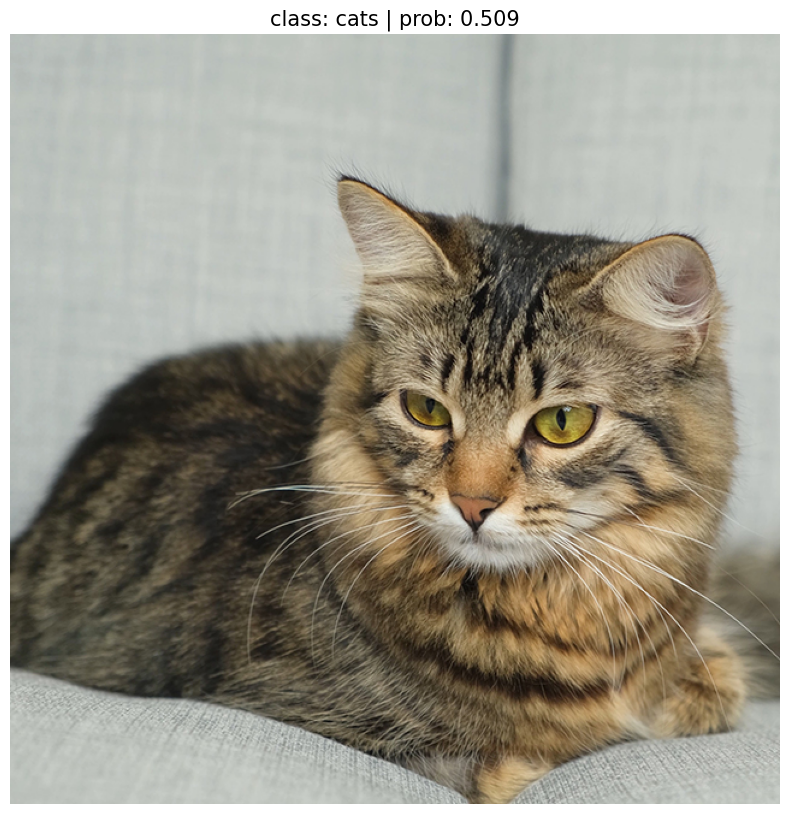

In [48]:
make_predict(model_0, cat_image, test_transformer, device)

## Step 9: Upgrade model if the results aren't good.

### Select other model
See more in https://pytorch.org/blog/how-to-train-state-of-the-art-models-using-torchvision-latest-primitives/

In [49]:
import torch
import torchvision.models as models
from torchinfo import summary
# from torchinfo import summary
# Custom URL for pretrained weights
pretrained_url = "https://download.pytorch.org/models/resnet50-11ad3fa6.pth"

# Download the weights
state_dict = torch.hub.load_state_dict_from_url(pretrained_url, progress=True)

# Load the ResNet-50 model
model_resnet = models.resnet50()
model_resnet.load_state_dict(state_dict)
# model_resnet = model_resnet.to(device)
# Modify the fully connected layer to have 2 outputs
num_ftrs = model_resnet.fc.in_features
model_resnet.fc = torch.nn.Linear(num_ftrs, 2)
model_resnet = model_resnet.to(device)  # Ensure model is on the correct device

# model_resnet
summary(model_resnet, (32, 3, 224, 224))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 2]                   --
├─Conv2d: 1-1                            [32, 64, 112, 112]        9,408
├─BatchNorm2d: 1-2                       [32, 64, 112, 112]        128
├─ReLU: 1-3                              [32, 64, 112, 112]        --
├─MaxPool2d: 1-4                         [32, 64, 56, 56]          --
├─Sequential: 1-5                        [32, 256, 56, 56]         --
│    └─Bottleneck: 2-1                   [32, 256, 56, 56]         --
│    │    └─Conv2d: 3-1                  [32, 64, 56, 56]          4,096
│    │    └─BatchNorm2d: 3-2             [32, 64, 56, 56]          128
│    │    └─ReLU: 3-3                    [32, 64, 56, 56]          --
│    │    └─Conv2d: 3-4                  [32, 64, 56, 56]          36,864
│    │    └─BatchNorm2d: 3-5             [32, 64, 56, 56]          128
│    │    └─ReLU: 3-6                    [32, 64, 56, 56]          --
│ 

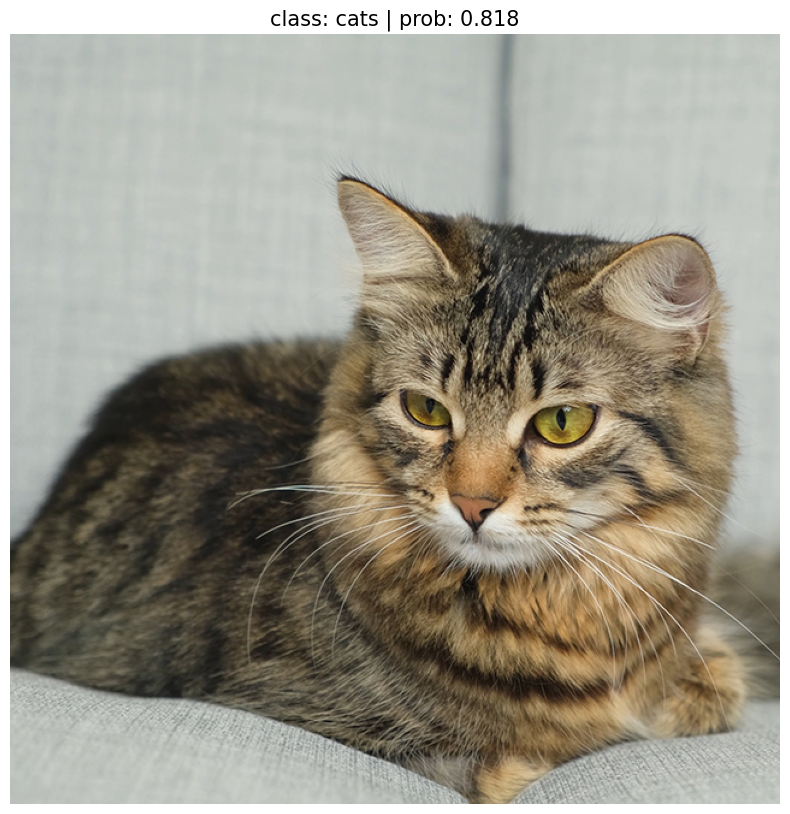

In [54]:
# test model
make_predict(model_resnet, cat_image, test_transformer, device)

### And train again with new model. How exciting heyyyy!

In [55]:
train_transformer = transforms.Compose([
    transforms.Resize(size=(224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
])

test_transformer = transforms.Compose([
    transforms.Resize(size=(224,224)),
    transforms.ToTensor()
])

In [56]:
results_model_resnet = train(model=model_resnet, epochs=50, lr=0.001, train_dataloader=train_dataloader, test_dataloader=test_dataloader, device=device)

100%|██████████| 50/50 [08:37<00:00, 10.35s/it]


Time train ResNet on cuda is 517.545127563 seconds


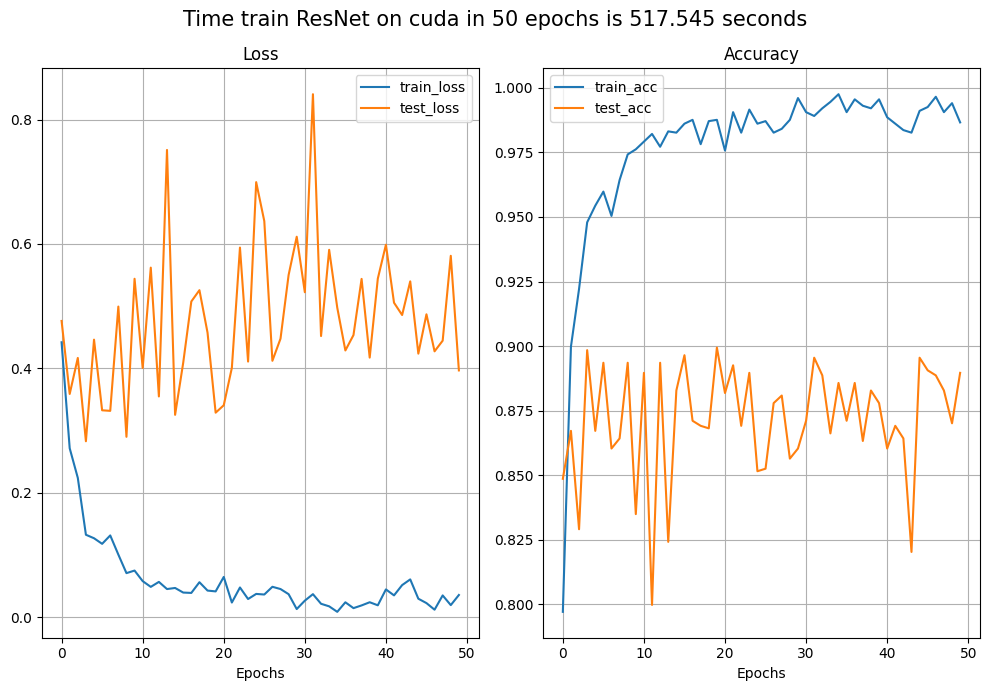

In [57]:
plot_training_and_testing_results(results_model_resnet)

In [59]:
results_model_resnet['train_loss'][-1], results_model_resnet['test_loss'][-1]

(0.035478727077133954, 0.3965782804880291)

### Make predict again

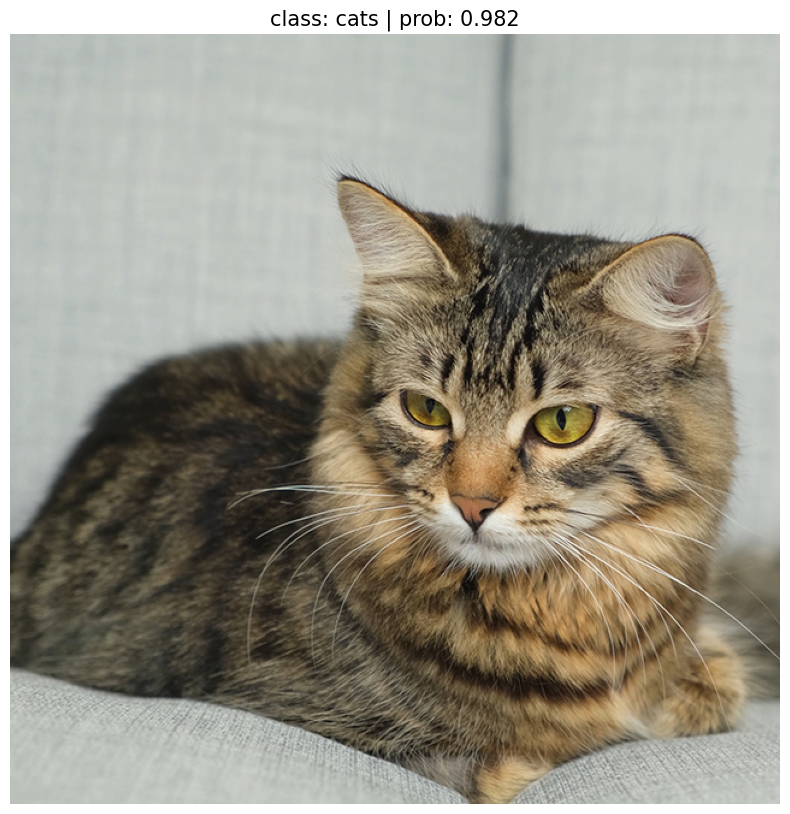

In [60]:
make_predict(model_resnet, cat_image, test_transformer, device)

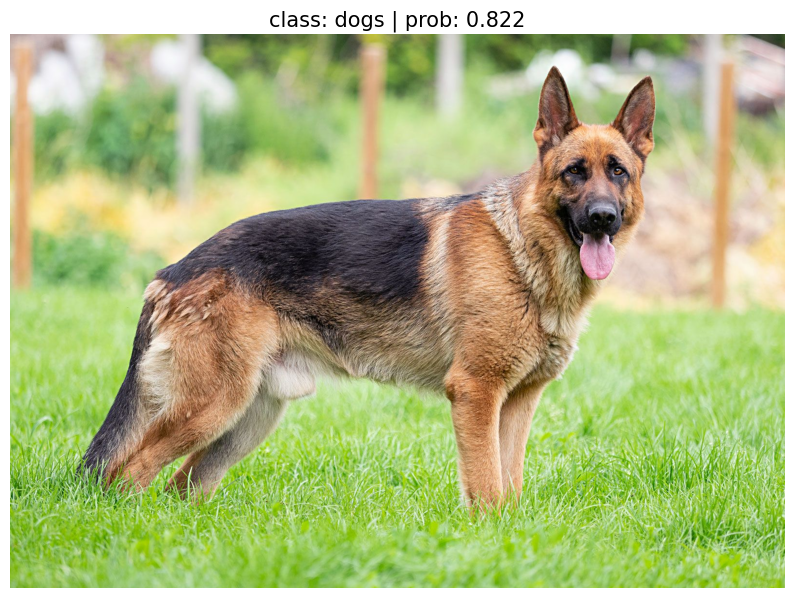

In [61]:
make_predict(model_resnet, dog_image, test_transformer, device)

# Compare two models

In [63]:
import pandas as pd

results = pd.DataFrame({'model_0': {"Model name": results_model_0["model_name"],
                                    "Train loss": results_model_0['train_loss'][-1],
                                    "Train Accuracy": results_model_0['train_acc'][-1],
                                    "Test loss": results_model_0['test_loss'][-1],
                                    "Test Accuracy": results_model_0['test_acc'][-1],
                                    "Time training": results_model_0['time_train']},
                        'model_resnet': {"Model name": results_model_resnet["model_name"],
                                    "Train loss": results_model_resnet['train_loss'][-1],
                                    "Train Accuracy": results_model_resnet['train_acc'][-1],
                                    "Test loss": results_model_resnet['test_loss'][-1],
                                    "Test Accuracy": results_model_resnet['test_acc'][-1],
                                    "Time training": results_model_resnet['time_train']}})
results

,model_0,model_resnet
Model name,TinyVGG,ResNet
Train loss,0.474122,0.035479
Train Accuracy,0.775298,0.986607
Test loss,0.587578,0.396578
Test Accuracy,0.702148,0.889648
Time training,376.558429,517.545128
